# Step 1: Prepare Unified Dataset from Swagger JSON

In [1]:
#!/usr/bin/env python3
"""
Generate Word documents for 6 core API endpoints from the original Swagger/OpenAPI JSON.

Endpoints: Token, Availability, Trip Sell, Passenger Names, Contact Details, Commit (skip Payment).

Usage:
  python generate_api_docs.py \
    --swagger swagger.json \
    --outdir ./out \
    [--mapping endpoint_map.json]

endpoint_map.json (optional) example:
{
  "Token": {"operationId": "Auth_Token_Create"},
  "Availability": {"path_contains": "/availability/search"},
  "Trip Sell": {"operationId": "OrderCreate"},
  "Passenger Names": {"path_contains": "/passengers"},
  "Contact Details": {"path_contains": "/contacts"},
  "Commit": {"operationId": "OrderCommit"}
}

If no mapping is provided, the script uses keyword scoring on api_id/path/summary/description.
"""

import json
import argparse
from datetime import datetime
from typing import Dict, Any, List, Optional
from docx import Document
from docx.shared import Pt
from docx.enum.text import WD_ALIGN_PARAGRAPH

ENDPOINTS = [
    {"name": "Token", "keywords": ["token", "auth", "login", "oauth", "jwt", "access"]},
    {"name": "Availability", "keywords": ["availability", "inventory", "search", "seats", "fare", "status"]},
    {"name": "Trip Sell", "keywords": ["sell", "trip", "booking", "order", "create", "reserve"]},
    {"name": "Passenger Names", "keywords": ["passenger", "name", "pax", "traveler"]},
    {"name": "Contact Details", "keywords": ["contact", "phone", "email", "address", "communication"]},
    {"name": "Commit", "keywords": ["commit", "confirm", "finalize", "purchase", "complete"]},
]

TODAY = datetime.now().strftime("%Y-%m-%d")

# -------------------- Swagger/OpenAPI helpers --------------------

def is_openapi3(sw: Dict[str, Any]) -> bool:
    return isinstance(sw.get("openapi"), str)


def is_openapi2(sw: Dict[str, Any]) -> bool:
    return isinstance(sw.get("swagger"), str)


def extract_parameters_v3(api_data: Dict[str, Any]) -> List[Dict[str, Any]]:
    params: List[Dict[str, Any]] = []
    # Path-level and operation-level parameters
    for plist in [api_data.get("parameters", [])]:
        for param in plist or []:
            if not isinstance(param, dict):
                continue
            schema = param.get("schema", {}) if isinstance(param.get("schema", {}), dict) else {}
            params.append({
                "name": param.get("name", ""),
                "in": param.get("in", "query"),
                "type": schema.get("type") or param.get("type", "string"),
                "required": param.get("required", False),
                "description": param.get("description", "")
            })
    # requestBody
    rb = api_data.get("requestBody")
    if isinstance(rb, dict):
        content = rb.get("content", {})
        for ctype, cval in content.items():
            schema = (cval or {}).get("schema", {})
            # Flatten object properties into params for listing convenience
            props = schema.get("properties", {}) if isinstance(schema, dict) else {}
            for key, val in props.items():
                params.append({
                    "name": key,
                    "in": f"body ({ctype})",
                    "type": val.get("type", "object"),
                    "required": key in (schema.get("required", []) or []),
                    "description": val.get("description", "")
                })
    return params


def extract_parameters_v2(api_data: Dict[str, Any]) -> List[Dict[str, Any]]:
    params: List[Dict[str, Any]] = []
    for param in api_data.get("parameters", []) or []:
        if not isinstance(param, dict):
            continue
        if param.get("in") == "body":
            schema = param.get("schema", {})
            props = schema.get("properties", {}) if isinstance(schema, dict) else {}
            for key, val in props.items():
                params.append({
                    "name": key,
                    "in": "body",
                    "type": val.get("type", "object"),
                    "required": key in (schema.get("required", []) or []),
                    "description": val.get("description", "")
                })
        else:
            params.append({
                "name": param.get("name", ""),
                "in": param.get("in", "query"),
                "type": param.get("type", "string"),
                "required": param.get("required", False),
                "description": param.get("description", "")
            })
    return params


def extract_responses_v3(api_data: Dict[str, Any]) -> Dict[str, Any]:
    out: Dict[str, Any] = {}
    for code, detail in api_data.get("responses", {}).items():
        if not isinstance(detail, dict):
            out[code] = {"description": ""}
            continue
        desc = detail.get("description", "")
        # Attempt to pull JSON schema example
        content = detail.get("content", {})
        schema = None
        for ctype, cval in content.items():
            if ctype.startswith("application/json"):
                schema = (cval or {}).get("schema")
                break
        out[code] = {"description": desc, "schema": schema}
    return out


def extract_responses_v2(api_data: Dict[str, Any]) -> Dict[str, Any]:
    out: Dict[str, Any] = {}
    for code, detail in api_data.get("responses", {}).items():
        if isinstance(detail, dict):
            out[code] = {"description": detail.get("description", ""), "schema": detail.get("schema")}
        else:
            out[code] = {"description": ""}
    return out


def build_entries(sw: Dict[str, Any]) -> List[Dict[str, Any]]:
    entries: List[Dict[str, Any]] = []
    paths = sw.get("paths", {})
    if not isinstance(paths, dict):
        return entries
    for path, methods in paths.items():
        if not isinstance(methods, dict):
            continue
        for method, api_data in methods.items():
            if not isinstance(api_data, dict):
                continue
            api_id = api_data.get("operationId") or f"{method}_{path.strip('/').replace('/', '_')}"
            summary = api_data.get("summary", "")
            description = api_data.get("description", "")
            tags = api_data.get("tags", []) if isinstance(api_data.get("tags", []), list) else []
            if is_openapi3(sw):
                parameters = extract_parameters_v3(api_data)
                responses = extract_responses_v3(api_data)
            else:
                parameters = extract_parameters_v2(api_data)
                responses = extract_responses_v2(api_data)
            entries.append({
                "api_id": api_id,
                "path": path,
                "method": method.upper(),
                "summary": summary,
                "description": description,
                "parameters": parameters,
                "responses": responses,
                "tags": tags,
            })
    return entries

# -------------------- Mapping helpers --------------------

def score_entry(entry: Dict[str, Any], keywords: List[str]) -> int:
    text_fields: List[str] = []
    for k in ("api_id", "path", "summary", "description"):
        v = entry.get(k, "")
        if isinstance(v, str):
            text_fields.append(v.lower())
        elif isinstance(v, list):
            text_fields.extend([str(x).lower() for x in v])
    blob = " ".join(text_fields)
    return sum(blob.count(kw.lower()) for kw in keywords)


def apply_mapping(entries: List[Dict[str, Any]], mapping: Dict[str, Any]) -> Dict[str, Optional[Dict[str, Any]]]:
    matched: Dict[str, Optional[Dict[str, Any]]] = {}
    for ep_name, rule in mapping.items():
        best = None
        for e in entries:
            ok = True
            if "operationId" in rule:
                ok = ok and (e.get("api_id") == rule["operationId"])  # strict match
            if "path_contains" in rule:
                ok = ok and (rule["path_contains"] in e.get("path", ""))
            if "method" in rule:
                ok = ok and (e.get("method") == rule["method"].upper())
            if ok:
                best = e
                break
        matched[ep_name] = best
    return matched


def auto_map(entries: List[Dict[str, Any]]) -> Dict[str, Optional[Dict[str, Any]]]:
    matched: Dict[str, Optional[Dict[str, Any]]] = {}
    for ep in ENDPOINTS:
        best_score = -1
        best_entry = None
        for e in entries:
            s = score_entry(e, ep["keywords"])
            if s > best_score:
                best_score = s
                best_entry = e
        matched[ep["name"]] = best_entry if (best_entry and best_score > 0) else None
    return matched

# -------------------- Example generators --------------------

def example_from_schema(schema: Any) -> Any:
    """Create a minimal example JSON from a JSON Schema-like dict."""
    if not isinstance(schema, dict):
        return ""
    t = schema.get("type")
    if not t:
        # infer by presence
        if "properties" in schema:
            t = "object"
        elif "items" in schema:
            t = "array"
    if t == "object":
        props = schema.get("properties", {})
        required = schema.get("required", []) or []
        out = {}
        for k, v in props.items():
            out[k] = example_from_schema(v)
        return out
    if t == "array":
        return [example_from_schema(schema.get("items", {}))]
    if t == "string":
        enum = schema.get("enum")
        return enum[0] if isinstance(enum, list) and enum else "string"
    if t == "integer":
        return 0
    if t == "number":
        return 0.0
    if t == "boolean":
        return True
    # fallback
    return ""

# -------------------- Document generation --------------------

def add_heading(doc: Document, text: str, level: int = 1):
    h = doc.add_heading(text, level=level)
    return h


def add_field(doc: Document, label: str, value: str = "TBD"):
    p = doc.add_paragraph()
    r1 = p.add_run(f"{label}: ")
    r1.bold = True
    p.add_run(value)


def create_endpoint_doc(outdir: str, endpoint_name: str, entry: Optional[Dict[str, Any]]):
    os.makedirs(outdir, exist_ok=True)
    doc = Document()
    title = doc.add_heading(f"API Specification: {endpoint_name}", level=0)
    title.alignment = WD_ALIGN_PARAGRAPH.LEFT
    meta = doc.add_paragraph()
    run = meta.add_run(f"Prepared for: Team Members\nDate: {TODAY}\nVersion: 1.0\n")
    run.font.size = Pt(10)

    add_heading(doc, "1. Overview")
    add_field(doc, "Purpose", "Describe the purpose of this endpoint and how it fits into the flow")
    add_field(doc, "Endpoint Name", endpoint_name)

    add_heading(doc, "2. Endpoint Details")
    if entry:
        add_field(doc, "HTTP Method", entry.get("method", "TBD"))
        add_field(doc, "Path", entry.get("path", "TBD"))
        add_field(doc, "Summary", entry.get("summary", "TBD"))
        add_field(doc, "Description", entry.get("description", "TBD"))
        tags = ", ".join(entry.get("tags", [])) if isinstance(entry.get("tags", []), list) else ""
        add_field(doc, "Tags", tags or "TBD")
    else:
        add_field(doc, "HTTP Method")
        add_field(doc, "Path")
        add_field(doc, "Summary")
        add_field(doc, "Description")
        add_field(doc, "Tags")

    add_heading(doc, "3. Authentication & Authorization")
    add_field(doc, "Requires Token", "Yes/No")
    add_field(doc, "Scopes/Roles", "TBD")

    add_heading(doc, "4. Request Specification")
    add_field(doc, "Headers", "Content-Type, Authorization: Bearer <token>, etc.")
    doc.add_paragraph("4.1 Path & Query Parameters")
    if entry and entry.get("parameters"):
        for prm in entry["parameters"]:
            line = (
                f"- {prm.get('name','param')} (in: {prm.get('in','body')}, type: {prm.get('type','string')}, "
                f"required: {prm.get('required', False)}) — {prm.get('description','')}"
            )
            doc.add_paragraph(line)
    else:
        doc.add_paragraph("- paramName (in: path|query|body, type: string, required: true) — description")

    doc.add_paragraph("4.2 Request Body (JSON)")
    if entry:
        # derive body example from parameters that are in body or requestBody
        # naive: build an object of body params
        body_params = [p for p in entry.get("parameters", []) if str(p.get("in", "")).startswith("body")]
        body_example = None
        if not body_params:
            # try responses for 201/200 request example? leave TBD
            body_example = {}
        else:
            body_example = {p.get("name", "field"): "value" for p in body_params}
        doc.add_paragraph("```json")
        doc.add_paragraph(json.dumps(body_example or {}, indent=2))
        doc.add_paragraph("```")
    else:
        doc.add_paragraph("```json\n{\n  // example body\n}\n```")

    add_heading(doc, "5. Response")
    doc.add_paragraph("5.1 Success Responses")
    if entry and entry.get("responses"):
        for code, detail in entry["responses"].items():
            desc = (detail or {}).get("description", "")
            doc.add_paragraph(f"- {code}: {desc}")
            schema = (detail or {}).get("schema")
            if schema:
                example = example_from_schema(schema)
                doc.add_paragraph("Example:")
                doc.add_paragraph("```json")
                try:
                    doc.add_paragraph(json.dumps(example, indent=2))
                except Exception:
                    doc.add_paragraph(str(example))
                doc.add_paragraph("```")
    else:
        doc.add_paragraph("- 200: OK — description")
        doc.add_paragraph("- 201: Created — description")

    doc.add_paragraph("5.2 Error Responses")
    doc.add_paragraph("- 400: Bad Request — validation error details")
    doc.add_paragraph("- 401: Unauthorized — invalid or missing token")
    doc.add_paragraph("- 404: Not Found — resource not found")
    doc.add_paragraph("- 500: Internal Server Error — generic failure")

    add_heading(doc, "6. Examples")
    doc.add_paragraph("6.1 Sample Request")
    method = (entry or {}).get("method", "GET")
    path = (entry or {}).get("path", "/path")
    doc.add_paragraph("```http")
    doc.add_paragraph(f"{method} {path}")
    doc.add_paragraph("Authorization: Bearer <token>")
    doc.add_paragraph("Content-Type: application/json")
    doc.add_paragraph("```")
    doc.add_paragraph("6.2 Sample Response")
    doc.add_paragraph("```json")
    doc.add_paragraph(json.dumps({"status": "success"}, indent=2))
    doc.add_paragraph("```")

    add_heading(doc, "7. Notes & Edge Cases")
    doc.add_paragraph("- Describe idempotency, rate limits, pagination, timeouts, sequencing requirements.")

    fname = f"API_{endpoint_name.replace(' ', '_')}.docx"
    out_path = os.path.join(outdir, fname)
    doc.save(out_path)
    return out_path


def create_combined_doc(outdir: str, matched: Dict[str, Optional[Dict[str, Any]]]):
    os.makedirs(outdir, exist_ok=True)
    doc = Document()
    doc.add_heading("API Specifications: Core 6 Endpoints (Payment Skipped)", level=0)
    sub = doc.add_paragraph(f"Date: {TODAY}\nVersion: 1.0\n")
    if sub.runs:
        sub.runs[0].font.size = Pt(10)
    for name, entry in matched.items():
        doc.add_page_break()
        doc.add_heading(name, level=1)
        def add(label, value):
            p = doc.add_paragraph()
            r = p.add_run(f"{label}: ")
            r.bold = True
            doc.add_paragraph(value)
        add("HTTP Method", (entry or {}).get("method", "TBD"))
        add("Path", (entry or {}).get("path", "TBD"))
        add("Summary", (entry or {}).get("summary", "TBD"))
        add("Description", (entry or {}).get("description", "TBD"))
        doc.add_paragraph("Parameters:")
        if entry and entry.get("parameters"):
            for prm in entry["parameters"]:
                doc.add_paragraph(
                    f"- {prm.get('name','param')} (in: {prm.get('in','body')}, type: {prm.get('type','string')}, required: {prm.get('required', False)})"
                )
        else:
            doc.add_paragraph("- TBD")
        doc.add_paragraph("Responses:")
        if entry and entry.get("responses"):
            for code, detail in entry["responses"].items():
                doc.add_paragraph(f"- {code}: {(detail or {}).get('description','')}")
        else:
            doc.add_paragraph("- TBD")
    out_path = os.path.join(outdir, "API_Spec_All_6_Endpoints.docx")
    doc.save(out_path)
    return out_path


def main():
    parser = argparse.ArgumentParser(description="Generate Word docs for 6 API endpoints from Swagger/OpenAPI JSON")
    parser.add_argument("--swagger", required=True, help="Path to original swagger.json (OpenAPI 2.0 or 3.x)")
    parser.add_argument("--outdir", default="./out", help="Output directory for .docx files")
    parser.add_argument("--mapping", default=None, help="Optional JSON file to map endpoints to operationId/path_contains/method")
    args = parser.parse_args()

    # Load swagger
    with open(args.swagger, "r", encoding="utf-8") as f:
        sw = json.load(f)

    entries = build_entries(sw)
    if not entries:
        raise SystemExit("No endpoints found in swagger paths.")

    # Build mapping target names
    endpoint_names = [e["name"] for e in ENDPOINTS]
    matched: Dict[str, Optional[Dict[str, Any]]]

    if args.mapping and os.path.exists(args.mapping):
        with open(args.mapping, "r", encoding="utf-8") as mf:
            mapping_rules = json.load(mf)
        # Ensure only our six endpoints are considered
        rules = {k: v for k, v in mapping_rules.items() if k in endpoint_names}
        # For any missing rule, we still try auto-match
        auto_for_missing = [name for name in endpoint_names if name not in rules]
        matched = apply_mapping(entries, rules)
        auto = auto_map(entries)
        for name in auto_for_missing:
            matched[name] = auto.get(name)
    else:
        matched = auto_map(entries)

    # Create docs
    os.makedirs(args.outdir, exist_ok=True)
    generated = []
    for ep in ENDPOINTS:
        path = create_endpoint_doc(args.outdir, ep["name"], matched.get(ep["name"]))
        generated.append(path)
    combined = create_combined_doc(args.outdir, {ep["name"]: matched.get(ep["name"]) for ep in ENDPOINTS})
    generated.append(combined)

    print("Created files:")
    for g in generated:
        print(" -", g)


if __name__ == "__main__":
    main()


ModuleNotFoundError: No module named 'docx'

In [6]:

import json
import uuid
from datetime import datetime
 
# === CONFIG ===
SWAGGER_FILE = "swagger.json"          # your Swagger/OpenAPI file
OUTPUT_FILE = "api_dataset_cleaned.json"
 
# === LOAD SWAGGER FILE ===
with open(SWAGGER_FILE, "r", encoding="utf-8") as f:
    swagger_data = json.load(f)
 
print(f"Loaded Swagger file successfully")
 
# === HELPER FUNCTION TO PARSE PARAMETERS ===
def extract_parameters(api_data):
    parameters = []
    if "parameters" in api_data:
        for param in api_data["parameters"]:
            parameters.append({
                "name": param.get("name", ""),
                "in": param.get("in", "body"),
                "type": param.get("schema", {}).get("type", "string"),
                "required": param.get("required", False),
                "description": param.get("description", "")
            })
    # Handle requestBody schema (OpenAPI 3.x)
    if "requestBody" in api_data:
        try:
            props = api_data["requestBody"]["content"]["application/json"]["schema"]["properties"]
            for key, val in props.items():
                parameters.append({
                    "name": key,
                    "in": "body",
                    "type": val.get("type", "string"),
                    "required": True,
                    "description": val.get("description", "")
                })
        except Exception:
            pass
    return parameters
 
# === HELPER FUNCTION TO PARSE RESPONSES ===
def extract_responses(api_data):
    responses = {}
    for code, detail in api_data.get("responses", {}).items():
        responses[code] = {"description": detail.get("description", "")}
    return responses
 
# === MAIN EXTRACTION ===
api_entries = []
 
for path, methods in swagger_data.get("paths", {}).items():
    for method, api_data in methods.items():
        api_id = api_data.get("operationId") or f"{method}_{path.strip('/').replace('/', '_')}"
        summary = api_data.get("summary", "")
        description = api_data.get("description", "")
 
        entry = {
            "api_id": api_id,
            "path": path,
            "method": method.upper(),
            "summary": summary,
            "description": description,
            "parameters": extract_parameters(api_data),
            "responses": extract_responses(api_data),
            "category": (path.split("/")[1] if len(path.split("/")) > 1 else "general"),
            "tags": api_data.get("tags", []),
            "example_request": {},
            "example_response": {},
            "source_file": SWAGGER_FILE,
            "last_updated": datetime.now().strftime("%Y-%m-%d")
          
        }
 
        api_entries.append(entry)
 
print(f" Extracted {len(api_entries)} endpoints from Swagger")
 
# === SAVE TO CLEANED DATASET ===
with open(OUTPUT_FILE, "w", encoding="utf-8") as f:
    json.dump(api_entries, f, indent=2, ensure_ascii=False)
 
print(f"\n Final dataset saved to: {OUTPUT_FILE}")
print(f"Total APIs processed: {len(api_entries)}")

Loaded Swagger file successfully
 Extracted 1024 endpoints from Swagger

 Final dataset saved to: api_dataset_cleaned.json
Total APIs processed: 1024


# Step 2: Generate Embeddings for APIs

In [ ]:

import json
import numpy as np
import faiss
from sentence_transformers import SentenceTransformer
 
# === CONFIG ===
DATA_FILE = "api_dataset_cleaned.json"
INDEX_FILE = "api_index.faiss"
EMBED_MODEL = "C:\Users\Arpit.x.Tripathi\Downloads\Rag_chatbot\models\all-MiniLM-L6-v2"
 
# === LOAD DATA ===
with open(DATA_FILE, "r", encoding="utf-8") as f:
    api_data = json.load(f)
 
print(f" Loaded dataset with {len(api_data)} API entries")
 
# === LOAD EMBEDDING MODEL ===
print(f" Loading model: {EMBED_MODEL}")
model = SentenceTransformer(EMBED_MODEL)
 
# === PREPARE TEXT CORPUS FOR EACH API ===
corpus = []
for api in api_data:
    text = f"{api['path']} | {api['method']} | {api['summary']} | {api['description']} | {' '.join(api.get('tags', []))}"
    corpus.append(text)
 
print(f" Creating embeddings for {len(corpus)} entries...")
 
# === GENERATE EMBEDDINGS ===
embeddings = model.encode(corpus, show_progress_bar=True)
embeddings = np.array(embeddings).astype("float32")
 
# === CREATE & SAVE FAISS INDEX ===
dimension = embeddings.shape[1]
index = faiss.IndexFlatL2(dimension)
index.add(embeddings)
 
faiss.write_index(index, INDEX_FILE)
print(f" FAISS index saved to: {INDEX_FILE}")
 
# === SAVE MAPPING (API Metadata) ===
with open("api_mapping.json", "w", encoding="utf-8") as f:
    json.dump(api_data, f, indent=2, ensure_ascii=False)
 
print(" Saved API metadata to api_mapping.json")
 
print("\n Embedding generation completed successfully!")

 Loaded dataset with 1024 API entries
 Loading model: all-MiniLM-L6-v2


'(MaxRetryError("HTTPSConnectionPool(host='huggingface.co', port=443): Max retries exceeded with url: /sentence-transformers/all-MiniLM-L6-v2/resolve/main/modules.json (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)')))"), '(Request ID: 84036b1c-49d8-4a03-a894-e81621ed9787)')' thrown while requesting HEAD https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2/resolve/main/./modules.json
Retrying in 1s [Retry 1/5].
'(MaxRetryError("HTTPSConnectionPool(host='huggingface.co', port=443): Max retries exceeded with url: /sentence-transformers/all-MiniLM-L6-v2/resolve/main/modules.json (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)')))"), '(Request ID: 2c6f8f1c-2c8b-4ec5-8716-cea6937512ab)')' thrown while requesting HEAD https://huggingface.co/sentence-transfor

# Step 3.1 : Load Models & Metadata ---

In [5]:

import json
import faiss
import numpy as np
from sentence_transformers import SentenceTransformer
from rank_bm25 import BM25Okapi
 
# === CONFIG ===
API_MAPPING_FILE = "api_mapping.json"
FAISS_INDEX_FILE = "api_index.faiss"
EMBED_MODEL = "all-MiniLM-L6-v2"
 
# === Load Metadata ===
print("Loading API metadata...")
with open(API_MAPPING_FILE, "r", encoding="utf-8") as f:
    api_metadata = json.load(f)
print(f"Loaded {len(api_metadata)} API entries")
 
# === Load Embedding Model ===
print("Loading embedding model...")
embed_model = SentenceTransformer(EMBED_MODEL)
 
# === Load FAISS Index ===
print("Loading FAISS index...")
index = faiss.read_index(FAISS_INDEX_FILE)
print(f"FAISS index loaded with {index.ntotal} vectors")
 
# === Build BM25 (optional) ===
print("Building BM25 index...")
bm25_corpus = []
for api in api_metadata:
    txt = f"{api.get('path','')} {api.get('method','')} {api.get('summary','')} {api.get('description','')}"
    bm25_corpus.append(txt.split())
 
bm25 = BM25Okapi(bm25_corpus)
print("BM25 index built successfully ")

Loading API metadata...
Loaded 1024 API entries
Loading embedding model...
Loading FAISS index...
FAISS index loaded with 1024 vectors
Building BM25 index...
BM25 index built successfully 


# Steps 3.2 : Hybrid Retrieval ---

In [5]:

import numpy as np
 
def embed_query(query: str):
    """Encode query into dense vector"""
    vec = embed_model.encode([query], convert_to_numpy=True)
    return vec.astype("float32")
 
def dense_search(query_vec, top_k=20):
    """FAISS dense vector search"""
    D, I = index.search(query_vec, top_k)
    results = []
    for idx, dist in zip(I[0], D[0]):
        sim = -float(dist)  # higher = better
        results.append((int(idx), sim))
    return results
 
def bm25_search(query, top_k=20):
    """BM25 sparse text search"""
    tokenized = query.lower().split()
    scores = bm25.get_scores(tokenized)
    ranked = np.argsort(scores)[::-1][:top_k]
    return [(int(i), float(scores[i])) for i in ranked]
 
def hybrid_search(query, top_k=20, bm25_weight=0.3):
    """Combine dense + BM25 scores"""
    qvec = embed_query(query)
    dense = dense_search(qvec, top_k)
    dense_scores = {i: s for i, s in dense}
 
    bm25_results = bm25_search(query, top_k)
    bm25_scores = {i: s for i, s in bm25_results}
 
    all_ids = set(list(dense_scores.keys()) + list(bm25_scores.keys()))
    hybrid = []
    for idx in all_ids:
        score = dense_scores.get(idx, 0) * (1 - bm25_weight) + bm25_scores.get(idx, 0) * bm25_weight
        hybrid.append((idx, score))
 
    hybrid = sorted(hybrid, key=lambda x: x[1], reverse=True)[:top_k]
    print(f"Retrieved {len(hybrid)} candidates for: {query}")
    return [{"id": i, "score": s, "meta": api_metadata[i]} for i, s in hybrid]
 # --- Example ---
query = "Which api responsible for get the booking dtails?"
results = hybrid_search(query, top_k=10)
for r in results[:5]:
    print(f"{r['meta']['path']}  [{r['meta']['method']}]  → {r['score']:.3f}")

NameError: name 'embed_model' is not defined

# Step 3.3 : Rerank Top Results ---

In [6]:

from sentence_transformers import CrossEncoder  # pip install cross-encoder
 
# === Load Reranker ===
print("Loading cross-encoder reranker...")
reranker = CrossEncoder("cross-encoder/ms-marco-MiniLM-L-6-v2")
 
def rerank_with_cross_encoder(query, candidates, top_k=5):
    pairs = []
    for c in candidates:
        text = f"{c['meta'].get('path','')} {c['meta'].get('summary','')} {c['meta'].get('description','')}"
        pairs.append((query, text))
 
    scores = reranker.predict(pairs)
    for i, s in enumerate(scores):
        candidates[i]['rerank_score'] = float(s)
 
    ranked = sorted(candidates, key=lambda x: x['rerank_score'], reverse=True)
    return ranked[:top_k]
 
# --- Example ---
query = "Which api responsible for get the booking dtails?"
top_candidates = rerank_with_cross_encoder(query, results, top_k=5)
for r in top_candidates:
    print(f"{r['meta']['path']} → {r['rerank_score']:.3f}")

Loading cross-encoder reranker...


'(MaxRetryError("HTTPSConnectionPool(host='huggingface.co', port=443): Max retries exceeded with url: /cross-encoder/ms-marco-MiniLM-L-6-v2/resolve/main/config.json (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)')))"), '(Request ID: 1c746456-c7f8-4e77-baa6-4bd9c55e0849)')' thrown while requesting HEAD https://huggingface.co/cross-encoder/ms-marco-MiniLM-L-6-v2/resolve/main/config.json
Retrying in 1s [Retry 1/5].
'(MaxRetryError("HTTPSConnectionPool(host='huggingface.co', port=443): Max retries exceeded with url: /cross-encoder/ms-marco-MiniLM-L6-v2/resolve/main/config.json (Caused by SSLError(SSLCertVerificationError(1, '[SSL: CERTIFICATE_VERIFY_FAILED] certificate verify failed: unable to get local issuer certificate (_ssl.c:1000)')))"), '(Request ID: 4757e620-1fb2-453a-8549-ef30404b77a1)')' thrown while requesting HEAD https://huggingface.co/cross-encoder/ms-marco-MiniLM

NameError: name 'results' is not defined

# Step 3.4 : Generate Step-by-Step Plan ---

In [9]:

import json
 
def generate_plan(query, top_candidates):
    """Create a step-by-step plan template"""
    lines = [f"User Query: {query}", "\nSuggested API Workflow:\n"]
    for i, c in enumerate(top_candidates, 1):
        meta = c['meta']
        lines.append(f"Step {i}: {meta.get('summary','')}")
        lines.append(f"  Endpoint: {meta.get('path')}  |  Method: {meta.get('method')}")
        params = meta.get('parameters', [])
        if params:
            param_names = [p.get('name') for p in params]
            lines.append(f"  Parameters: {', '.join(param_names)}")
        lines.append("")  # blank line
    return "\n".join(lines)
 

In [3]:
# --- Example ---
query = "Which api responsible for get the booking dtails? "
plan = generate_plan(query, top_candidates)
print(plan)

NameError: name 'generate_plan' is not defined

# final Step  Agentic API Assistant ---

In [11]:
from sentence_transformers import SentenceTransformer
embed_model = SentenceTransformer("all-MiniLM-L6-v2")
print("Model loaded successfully")

Model loaded successfully


In [ ]:
# ====== Initialization Cell (Run ONCE) ======
# Loads embedding model, FAISS index, metadata, BM25, reranker.
# After this cell, call answer_query("...") whenever you want.
 
import os
import json
import faiss
import numpy as np
import re
from datetime import datetime
from sentence_transformers import SentenceTransformer
from rank_bm25 import BM25Okapi
from sentence_transformers import CrossEncoder   # pip install cross-encoder
from sklearn.preprocessing import MinMaxScaler
 
# -------- CONFIG (update paths if needed) ----------
API_MAPPING_FILE = "api_mapping.json"    # output from Step 2
FAISS_INDEX_FILE = "api_index.faiss"     # output from Step 2
EMBED_MODEL_NAME = "all-MiniLM-L6-v2"
RERANKER_MODEL = "cross-encoder/ms-marco-MiniLM-L-6-v2"
 
# --------- LOAD / INIT ----------
print("Loading API metadata...")
with open(API_MAPPING_FILE, "r", encoding="utf-8") as f:
    api_metadata = json.load(f)
print(f"Loaded {len(api_metadata)} API entries")
 
print("Loading FAISS index...")
index = faiss.read_index(FAISS_INDEX_FILE)
print("FAISS index loaded. vectors:", index.ntotal)
 
print(f"Loading embedding model: {EMBED_MODEL_NAME} ...")
embed_model = SentenceTransformer(EMBED_MODEL_NAME)
print("Embedding model loaded.")
 
# Build BM25 corpus (tokenized)
def clean_text_tokens(text: str):
    if not isinstance(text, str):
        text = ""
    text = re.sub(r'[^a-zA-Z0-9 ]', ' ', text).lower()
    return text.split()
 
print("Building BM25 index...")
bm25_corpus = []
for m in api_metadata:
    txt = f"{m.get('path','')} {m.get('method','')} {m.get('summary','')} {m.get('description','')} {' '.join(m.get('tags',[]))}"
    bm25_corpus.append(clean_text_tokens(txt))
bm25 = BM25Okapi(bm25_corpus)
print("BM25 ready.")
 
print(f"Loading reranker: {RERANKER_MODEL} ...")
reranker = CrossEncoder(RERANKER_MODEL, device="cpu")  # set device="cuda" if available
print("Reranker loaded.")
 
# --------- Utility functions ----------
def embed_query(query: str):
    vec = embed_model.encode([query], convert_to_numpy=True)
    if vec.ndim == 1:
        vec = vec.reshape(1, -1)
    return vec.astype("float32")
 
def dense_search(query_vec, top_k=50):
    D, I = index.search(query_vec, top_k)
    results = []
    for idx, dist in zip(I[0], D[0]):
        if idx < 0:
            continue
        sim = 1.0 / (1.0 + float(dist))   # convert L2 distance to similarity-like score
        results.append((int(idx), sim))
    return results
 
def bm25_search(query, top_k=50):
    tokens = clean_text_tokens(query)
    scores = bm25.get_scores(tokens)
    ranked = np.argsort(scores)[::-1][:top_k]
    return [(int(i), float(scores[i])) for i in ranked]
 
def hybrid_retrieve(query, top_k=20, bm25_weight=0.35):
    """
    Hybrid retrieval combining dense (FAISS) and BM25.
    Returns list of dicts: {'id', 'score', 'meta'}
    """
    qvec = embed_query(query)
    dense = dense_search(qvec, top_k*2)
    bm25_res = bm25_search(query, top_k*2)
 
    # Normalize both score lists to [0,1] separately
    dense_scores = np.array([s for _, s in dense]).reshape(-1,1) if dense else np.array([[0.0]])
    bm25_scores = np.array([s for _, s in bm25_res]).reshape(-1,1) if bm25_res else np.array([[0.0]])
 
    d_norm = MinMaxScaler().fit_transform(dense_scores).flatten() if len(dense_scores)>0 else []
    b_norm = MinMaxScaler().fit_transform(bm25_scores).flatten() if len(bm25_scores)>0 else []
 
    dense_dict = {dense[i][0]: d_norm[i] for i in range(len(dense))} if dense else {}
    bm25_dict = {bm25_res[i][0]: b_norm[i] for i in range(len(bm25_res))} if bm25_res else {}
 
    all_ids = set(list(dense_dict.keys()) + list(bm25_dict.keys()))
    hybrid = []
    for idx in all_ids:
        d = dense_dict.get(idx, 0.0)
        b = bm25_dict.get(idx, 0.0)
        score = (1 - bm25_weight) * d + bm25_weight * b
        hybrid.append((idx, float(score)))
    hybrid = sorted(hybrid, key=lambda x: x[1], reverse=True)[:top_k]
    return [{"id": idx, "score": s, "meta": api_metadata[idx]} for idx, s in hybrid]
 
def rerank_candidates(query: str, candidates: list, top_k=5):
    """
    Use cross-encoder to rerank candidate list.
    Candidates is list of dicts with 'meta'
    Returns top_k list with rerank_score included.
    """
    if not candidates:
        return []
    pair_texts = []
    for c in candidates:
        m = c["meta"]
        text = f"{m.get('path','')} {m.get('method','')} {m.get('summary','')} {m.get('description','')} {' '.join(m.get('tags',[]))}"
        pair_texts.append((query, text))
    scores = reranker.predict(pair_texts)
    for i, s in enumerate(scores):
        candidates[i]["rerank_score"] = float(s)
    ranked = sorted(candidates, key=lambda x: x["rerank_score"], reverse=True)[:top_k]
    return ranked
 
# Template deterministic planner (safe, no LLM required)
def template_plan(query: str, reranked: list):
    lines = []
    lines.append(f"User Query: {query}")
    lines.append(f"Generated at: {datetime.utcnow().isoformat()}Z")
    lines.append("\nSuggested API Workflow (top results):\n")
    for i, c in enumerate(reranked, start=1):
        m = c["meta"]
        lines.append(f"Step {i}: {m.get('summary') or m.get('path')}")
        lines.append(f"  Endpoint: {m.get('path')}  Method: {m.get('method')}")
        params = m.get("parameters", [])
        if params:
            # show parameter names and types
            param_lines = []
            for p in params:
                pname = p.get("name", "<name>")
                ptype = p.get("type", p.get("schema", {}).get("type", "string"))
                required = p.get("required", False)
                param_lines.append(f"{pname}({ptype}){'*' if required else ''}")
            lines.append("  Parameters: " + ", ".join(param_lines))
        if m.get("example_request"):
            lines.append("  Example request body: " + json.dumps(m.get("example_request"), ensure_ascii=False))
        else:
            # create a minimal example body from parameters (if present)
            if params:
                example = {}
                for p in params:
                    pname = p.get("name")
                    ptype = p.get("type","string")
                    if "email" in (p.get("description","") or "").lower() or "email" in pname.lower():
                        example[pname] = "user@example.com"
                    elif ptype.startswith("int") or ptype == "integer":
                        example[pname] = 123
                    else:
                        example[pname] = f"<{pname}>"
                lines.append("  Example request body: " + json.dumps(example, ensure_ascii=False))
        lines.append("")  # blank line
    return "\n".join(lines)
 
print("\nInitialization complete. You can now call answer_query(query) repeatedly without reloading models.")

'(MaxRetryError('HTTPSConnectionPool(host=\'huggingface.co\', port=443): Max retries exceeded with url: /sentence-transformers/all-MiniLM-L6-v2/resolve/main/modules.json (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x0000025F1E1B9DC0>: Failed to resolve \'huggingface.co\' ([Errno 11001] getaddrinfo failed)"))'), '(Request ID: 86bf9043-1767-4fce-9729-6f50f2b510e9)')' thrown while requesting HEAD https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2/resolve/main/./modules.json
Retrying in 1s [Retry 1/5].


Loading API metadata...
Loaded 1024 API entries
Loading FAISS index...
FAISS index loaded. vectors: 1024
Loading embedding model: all-MiniLM-L6-v2 ...


'(MaxRetryError('HTTPSConnectionPool(host=\'huggingface.co\', port=443): Max retries exceeded with url: /sentence-transformers/all-MiniLM-L6-v2/resolve/main/modules.json (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x0000025F1DF595E0>: Failed to resolve \'huggingface.co\' ([Errno 11001] getaddrinfo failed)"))'), '(Request ID: c5c44303-97be-46a5-bb03-220a1145991d)')' thrown while requesting HEAD https://huggingface.co/sentence-transformers/all-MiniLM-L6-v2/resolve/main/./modules.json
Retrying in 2s [Retry 2/5].
'(MaxRetryError('HTTPSConnectionPool(host=\'huggingface.co\', port=443): Max retries exceeded with url: /sentence-transformers/all-MiniLM-L6-v2/resolve/main/modules.json (Caused by NameResolutionError("<urllib3.connection.HTTPSConnection object at 0x0000025F1E7D8200>: Failed to resolve \'huggingface.co\' ([Errno 11001] getaddrinfo failed)"))'), '(Request ID: 01b07f19-72e5-4a51-8dc1-d0c85a600f9d)')' thrown while requesting HEAD https://huggingface.

In [16]:

# 🔹 Agentic API Assistant – Final Pipeline

 
import os
import requests
from dotenv import load_dotenv
 
# --- Load Groq API key ---
load_dotenv()
GROQ_API_KEY = os.getenv("GROQ_API_KEY")
 
# --- Call Groq LLM ---
def call_groq_llm(prompt: str, model: str = "llama3-70b-8192"):
    url = "https://api.groq.com/openai/v1/chat/completions"
    headers = {
        "Authorization": f"Bearer {GROQ_API_KEY}",
        "Content-Type": "application/json"
    }
    payload = {
        "model": model,
        "messages": [
            {
                "role": "system",
                "content": (
                    "You are an expert backend developer assistant. "
                    "Explain APIs in a structured yet conversational tone. "
                    "Always show endpoint, method, key parameters, and a JSON example."
                ),
            },
            {"role": "user", "content": prompt}
        ],
        "temperature": 0.4,
    }
 
    response = requests.post(url, headers=headers, json=payload)
    response.raise_for_status()
    data = response.json()
    return data["choices"][0]["message"]["content"].strip()
 
 
# --- Master Query Function ---
def answer_query(query: str, top_k_retrieve: int = 20, top_k_rerank: int = 5, use_llm: bool = True):
    """
    Complete Agentic API pipeline:
      1. Hybrid retrieval (dense + BM25)
      2. Rerank results
      3. Structured plan generation
      4. Groq LLM natural-language explanation
    """
    print(f"🔍 Query received: {query}\n")
 
    # Step 1️⃣ Retrieve candidates
    candidates = hybrid_retrieve(query, top_k=top_k_retrieve)
    if not candidates:
        return "No matching APIs found."
 
    # Step 2️⃣ Rerank
    top_candidates = rerank_candidates(query, candidates, top_k=top_k_rerank)
 
    # Step 3️⃣ Generate structured plan
    structured_plan = template_plan(query, top_candidates)
 
    # Step 4️⃣ Send to Groq LLM for explanation
    if use_llm:
        llm_prompt = f"""
Developer query: "{query}"
 
Below are the top API results retrieved from the system:
{structured_plan}
 
Please:
1. Identify the best API or combination of APIs to solve the developer's query.
2. Explain what the API does, when to use it, and any special authentication/permissions needed.
3. Provide details clearly:
   - **Endpoint:** URL path
   - **Method:** GET/POST/PUT/DELETE
   - **Parameters:** required + optional
   - **Description:** what it performs
4. Show an example request and response in JSON format.
5. Conclude with 2–3 steps guiding a developer on how to integrate this API.
"""
 
        try:
            final_answer = call_groq_llm(llm_prompt)
        except Exception as e:
            print(f"[⚠️ LLM error: {e}] Showing fallback structured output.\n")
            final_answer = structured_plan
    else:
        final_answer = structured_plan
 
    return final_answer
 

In [ ]:
# --- ✅ Example Query ---
response = answer_query("How can i change passsword")
print("\n🧩 Final Developer Response:\n")
print(response)

NameError: name 'answer_query' is not defined

In [22]:
# --- ✅ Example Query ---
response = answer_query("Which api responsible for get the booking dtails? ")
print("\n🧩 Final Developer Response:\n")
print(response)

🔍 Query received: Which api responsible for get the booking dtails? 



C:\Users\Arpit.x.Tripathi\AppData\Local\Temp\ipykernel_30568\178900491.py:130: DeprecationWarning: datetime.datetime.utcnow() is deprecated and scheduled for removal in a future version. Use timezone-aware objects to represent datetimes in UTC: datetime.datetime.now(datetime.UTC).
  lines.append(f"Generated at: {datetime.utcnow().isoformat()}Z")


[⚠️ LLM error: 400 Client Error: Bad Request for url: https://api.groq.com/openai/v1/chat/completions] Showing fallback structured output.


🧩 Final Developer Response:

User Query: Which api responsible for get the booking dtails? 
Generated at: 2025-10-15T07:11:48.651322Z

Suggested API Workflow (top results):

Step 1: Gets a specific booking by third party record locator and stores it in state.
  Endpoint: /api/nsk/v1/booking/retrieve/byThirdPartyRecordLocator  Method: GET
  Parameters: SystemCode(string), ThirdPartyRecordLocator(string)
  Example request body: {"SystemCode": "<SystemCode>", "ThirdPartyRecordLocator": "<ThirdPartyRecordLocator>"}

Step 2: Retrieves the booking account and collections based on the record locator.
  Endpoint: /api/nsk/v1/bookings/{recordLocator}/account  Method: GET
  Parameters: recordLocator(string)*
  Example request body: {"recordLocator": "<recordLocator>"}

Step 3: Retrieves the booking payments on the booking in state.
  Endpoint: /api/nsk/v1/b

In [16]:
import os
from dotenv import load_dotenv
from langchain_community.document_loaders import JSONLoader
from langchain.vectorstores import FAISS
from sentence_transformers import SentenceTransformer
from langchain_huggingface import HuggingFaceEmbeddings

load_dotenv()


file_path = "swagger.json"

# Load the JSON File as Documents
loader = JSONLoader(file_path=file_path, jq_schema=".[]", text_content=False)
documents = loader.load()

# Initialize an Open-Source Embedding Model (using SentenceTransformers)
model_name = r"C:\Users\Arpit.x.Tripathi\Downloads\Rag_chatbot\models\all-MiniLM-L6-v2"  # Lightweight and free
# Create a HuggingFaceEmbeddings instance which internally uses SentenceTransformers
embeddings = HuggingFaceEmbeddings(model_name=model_name)

# Create a FAISS Vector Store from the Documents
faiss_db = FAISS.from_documents(documents, embeddings)

# (Optional) Persist the FAISS index locally for later use.
faiss_db.save_local("data/faiss_index")

page_content='NSwag v14.2.0.0 (NJsonSchema v11.1.0.0 (Newtonsoft.Json v13.0.0.0))' metadata={'source': 'C:\\Users\\Arpit.x.Tripathi\\Downloads\\Rag_chatbot\\swagger.json', 'seq_num': 1}
page_content='{"title": "API - Current Routes", "description": "All endpoints that are not marked as obsolete.", "version": "4.5.2.736"}' metadata={'source': 'C:\\Users\\Arpit.x.Tripathi\\Downloads\\Rag_chatbot\\swagger.json', 'seq_num': 3}
page_content='{"/api/nsk/v3/account/password/change": {"post": {"tags": ["account"], "summary": "Changes the accounts password.", "description": "This endpoint is recommended for a user who has an expired password.\n    This endpoint is restricted to the anonymous user only\n    and remains as the anonymous user even if the change password operation completed.\n    For changing the password of a logged-in user, please use /api/nsk/v3/user/password/change.\n\n\n    This follows domain level restrictions and could result in a failed change if there is a minimum time\n 
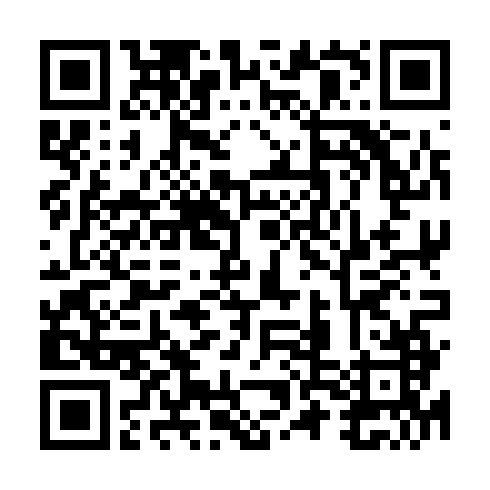
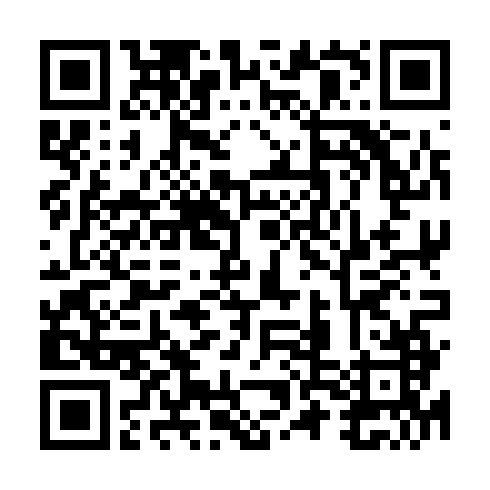

In [17]:
# Example query text
query = "which end point responsible check in"

# Perform a similarity search
results = faiss_db.similarity_search(query, )

# Print out the results
for result in results:
    print(result)  # or result.metadata, depending on what you stored

### If the Computer is restarted then you can load local

In [18]:
# from langchain.vectorstores import FAISS
# from langchain_huggingface import HuggingFaceEmbeddings

# model_name = "all-MiniLM-L6-v2"
# embeddings = HuggingFaceEmbeddings(model_name=model_name)

# # Load the persisted FAISS index with dangerous deserialization allowed
# faiss_db = FAISS.load_local("data/faiss_index", embeddings, allow_dangerous_deserialization=True)

# query = "what is the product of the week?"
# results = faiss_db.similarity_search(query)

# for result in results:
#     print(result.page_content)

### Code to add other json files (i.e., new data) into this existing vector db

In [19]:
# import os
# from dotenv import load_dotenv
# from langchain_community.document_loaders import JSONLoader
# from langchain.vectorstores import FAISS
# from langchain_huggingface import HuggingFaceEmbeddings

# # Load environment variables
# load_dotenv()

# # Define paths for the new JSON files
# new_files = [
#     "privacy-policy.json",
#     "common-questions.json"
# ]

# # Initialize your embedding model (ensure it's the same as used before)
# model_name = "all-MiniLM-L6-v2"
# embeddings = HuggingFaceEmbeddings(model_name=model_name)

# # Load the existing FAISS index from disk, allowing dangerous deserialization if needed
# faiss_db = FAISS.load_local("data/faiss_index", embeddings, allow_dangerous_deserialization=True)

# # Loop over each new JSON file, load documents and add them to the index
# for file_path in new_files:
#     # Load the JSON file as documents
#     loader = JSONLoader(file_path=file_path, jq_schema=".[]", text_content=False)
#     new_documents = loader.load()
    
#     # Add the new documents to the existing FAISS index
#     faiss_db.add_documents(new_documents)

# # Optionally, persist the updated FAISS index
# faiss_db.save_local("data/faiss_index")

In [20]:
# from langchain.vectorstores import FAISS
# from langchain_huggingface import HuggingFaceEmbeddings

# model_name = "all-MiniLM-L6-v2"
# embeddings = HuggingFaceEmbeddings(model_name=model_name)

# # Load the persisted FAISS index with dangerous deserialization allowed
# faiss_db = FAISS.load_local("data/faiss_index", embeddings, allow_dangerous_deserialization=True)

# query = "troubleshoot"
# results = faiss_db.similarity_search(query)

# for result in results:
#     print(result.page_content)

In [21]:
from langchain.vectorstores import FAISS
from langchain_huggingface import HuggingFaceEmbeddings

def query_faiss(user_query, index_path="data/faiss_index", top_k=5):
    """
    Given a user query, this function loads the persisted FAISS index,
    performs a similarity search, and returns the top_k matching documents.
    
    Args:
        user_query (str): The input query from the user.
        index_path (str): The path where the FAISS index is saved.
        top_k (int): Number of similar documents to return.
        
    Returns:
        list: A list of the top_k matching document objects.
    """
    # Initialize the embedding model (should match the one used to build the index)
    model_name = "all-MiniLM-L6-v2"
    embeddings = HuggingFaceEmbeddings(model_name=model_name)
    
    # Load the persisted FAISS index (allow dangerous deserialization if needed)
    faiss_db = FAISS.load_local(index_path, embeddings, allow_dangerous_deserialization=True)
    
    # Perform similarity search with the given query
    results = faiss_db.similarity_search(user_query, k=top_k)
    
    return results


Top matching documents:
-----
{"title": "API - Current Routes", "description": "All endpoints that are not marked as obsolete.", "version": "4.5.2.736"}
-----
{"schemas": {"IJsonResponseOfPricingConfiguration": {"type": "object", "description": "Defines the JSON response contract.\n            ", "additionalProperties": false, "properties": {"data": {"description": "The payload data.\n            ", "nullable": true, "$ref": "#/components/schemas/PricingConfiguration"}, "errors": {"type": "array", "description": "The collection of errors being thrown.\n            ", "nullable": true, "items": {"$ref": "#/components/schemas/ErrorResponse"}}, "messages": {"type": "array", "description": "The collection of informational messages.\n            ", "nullable": true, "items": {"$ref": "#/components/schemas/Message"}}}}, "PricingConfiguration": {"type": "object", "description": "Defines the pricing configuration model.\n            ", "additionalProperties": false, "properties": {"chargeCode
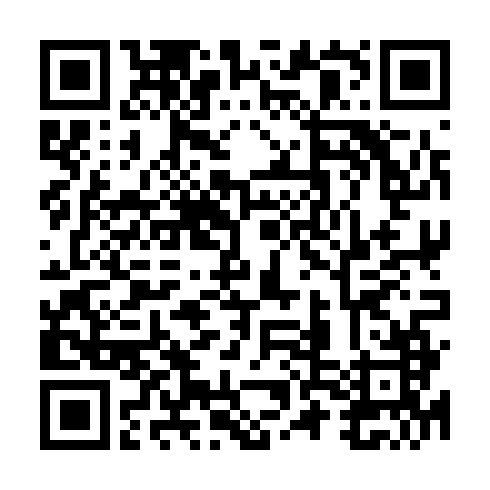
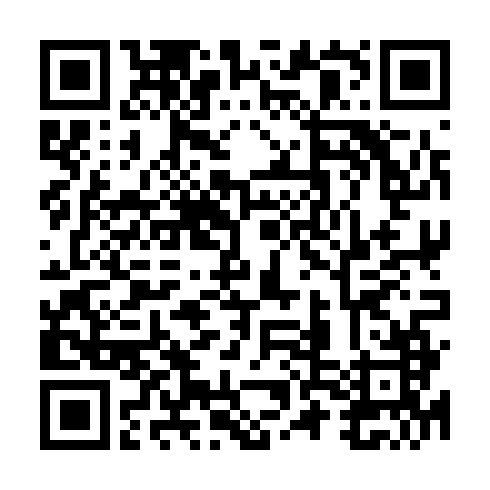

In [22]:
# Example usage:
if __name__ == "__main__":
    query = input("Enter your query: ")
    similar_docs = query_faiss(query)
    
    print("\nTop matching documents:")
    for doc in similar_docs:
        print("-----")
        print(doc.page_content)  # or use doc.metadata if that's more appropriate

In [23]:
import os
from dotenv import load_dotenv
from langchain.vectorstores import FAISS
from langchain_huggingface import HuggingFaceEmbeddings
from langchain_google_genai import ChatGoogleGenerativeAI  # ✅ Gemini model
from langchain.schema import HumanMessage, SystemMessage

# Load environment variables (make sure GOOGLE_API_KEY is set)
load_dotenv()

# Initialize Gemini model
llm = ChatGoogleGenerativeAI(
    model="gemini-1.5-flash",  # or "gemini-1.5-flash" for faster inference
    temperature=0.2,
    google_api_key=os.getenv("GOOGLE_API_KEY")
)

def construct_rag_prompt(query, retrieved_docs):
    """
    Build a prompt that includes retrieved document content and the user's query.
    """
    context = "\n\n".join([doc.page_content for doc in retrieved_docs])
    prompt = (
        "You are a helpful assistant that uses the following context to answer the question.\n\n"
        "Context:\n"
        f"{context}\n\n"
        "Question:\n"
        f"{query}\n\n"
        "Note: If the 'Question' the user asks is not present in the 'Context', then you will respond with 'Unfortunately we do not have answer for that.'"
    )
    return prompt

# Example usage:
# response = llm([SystemMessage(content="You are a helpful assistant."), HumanMessage(content=construct_rag_prompt(query, docs))])
# print(response.content)


In [24]:
# import os
# from dotenv import load_dotenv
# from langchain.vectorstores import FAISS
# from langchain_huggingface import HuggingFaceEmbeddings
# from langchain.chat_models import ChatOpenAI
# from langchain.callbacks import StreamlitCallbackHandler  # example callback for streaming output
# from langchain.schema import HumanMessage, SystemMessage

# # Load environment variables (make sure OPENAI_API_KEY is set)
# load_dotenv()


# def construct_rag_prompt(query, retrieved_docs):
#     """
#     Build a prompt that includes retrieved document content and the user's query.
#     """
#     context = "\n\n".join([doc.page_content for doc in retrieved_docs])
#     prompt = (
#         "You are a helpful assistant that uses the following context to answer the question.\n\n"
#         "Context:\n"
#         f"{context}\n\n"
#         "Question:\n"
#         f"{query}\n\n"
#         "Note: If the 'Question' the user asks is not present in the 'Context', then you will respond with 'Unfortunately we do not have answer for that."
#     )
#     return prompt



--- RAG Prompt ---

You are a helpful assistant that uses the following context to answer the question.

Context:
{"title": "API - Current Routes", "description": "All endpoints that are not marked as obsolete.", "version": "4.5.2.736"}

{"schemas": {"IJsonResponseOfPricingConfiguration": {"type": "object", "description": "Defines the JSON response contract.\n            ", "additionalProperties": false, "properties": {"data": {"description": "The payload data.\n            ", "nullable": true, "$ref": "#/components/schemas/PricingConfiguration"}, "errors": {"type": "array", "description": "The collection of errors being thrown.\n            ", "nullable": true, "items": {"$ref": "#/components/schemas/ErrorResponse"}}, "messages": {"type": "array", "description": "The collection of informational messages.\n            ", "nullable": true, "items": {"$ref": "#/components/schemas/Message"}}}}, "PricingConfiguration": {"type": "object", "description": "Defines the pricing configuration 
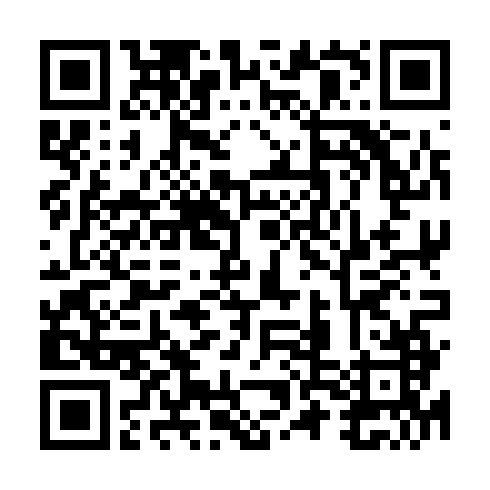
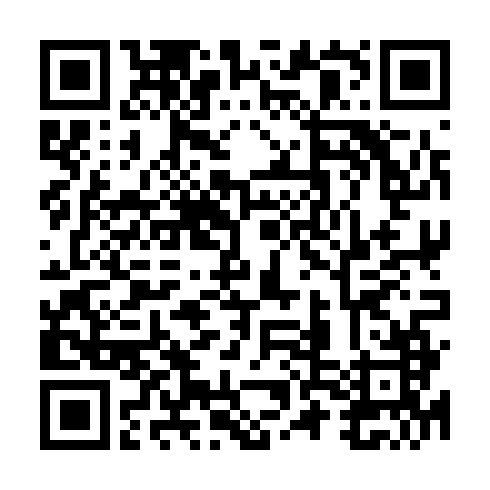

Unauthenticated: 401 API keys are not supported by this API. Expected OAuth2 access token or other authentication credentials that assert a principal. See https://cloud.google.com/docs/authentication [reason: "CREDENTIALS_MISSING"
domain: "googleapis.com"
metadata {
  key: "service"
  value: "generativelanguage.googleapis.com"
}
metadata {
  key: "method"
  value: "google.ai.generativelanguage.v1beta.GenerativeService.StreamGenerateContent"
}
]

In [25]:
import os
from dotenv import load_dotenv
import google.generativeai as genai

# Load environment variables from .env file
load_dotenv()

# Get API key and model name from .env
GOOGLE_API_KEY = os.getenv("GOOGLE_API_KEY")
MODEL_NAME = os.getenv("MODEL_NAME", "gemini-1.5-flash")  # Default to gemini-1.5-flash

# Configure Gemini API
genai.configure(api_key=GOOGLE_API_KEY)

# Get user's query
user_query = input("Enter your query: ")

# Step 1: Retrieve similar documents using FAISS
# You must define this function separately
retrieved_docs = query_faiss(user_query, index_path="data/faiss_index", top_k=3)

# Step 2: Construct the RAG prompt
# You must define this function separately
prompt = construct_rag_prompt(user_query, retrieved_docs)

print("\n\n--- RAG Prompt ---\n")
print(prompt)

print("\n\n--- Streaming Response ---\n")

# Initialize Gemini model (no 'models/' prefix)
model = genai.GenerativeModel(model_name=MODEL_NAME)

# Stream the response
answer = ""
for chunk in model.generate_content(prompt, stream=True):
    if chunk.text:
        print(chunk.text, end="", flush=True)
        answer += chunk.text

print("\n\n--- Final Answer ---\n")
print(answer)

In [ ]:
import os
from dotenv import load_dotenv
import google.generativeai as genai

# Load environment variables
load_dotenv()

# Get API key and model name from .env
GOOGLE_API_KEY = os.getenv("GOOGLE_API_KEY")
MODEL_NAME = os.getenv("MODEL_NAME", "gemini-2.0-flash")  # Default if not set

# Configure Gemini API
genai.configure(api_key=GOOGLE_API_KEY)

# Get user's query
user_query = input("Enter your query: ")

# Step 1: Retrieve similar documents using FAISS
retrieved_docs = query_faiss(user_query, index_path="data/faiss_index", top_k=3)

# Step 2: Construct the RAG prompt
prompt = construct_rag_prompt(user_query, retrieved_docs)
print("\n\n--- RAG Prompt ---\n")
print(prompt)
print("\n\n--- Streaming Response ---\n")

# Initialize Gemini model with correct prefix
model = genai.GenerativeModel(f"models/{MODEL_NAME}")

# Stream the response
answer = ""
for chunk in model.generate_content(prompt, stream=True):
    if chunk.text:
        print(chunk.text, end="", flush=True)
        answer += chunk.text

print("\n\n--- Final Answer ---\n")
print(answer)

In [ ]:
# from openai import OpenAI

# # Get user's query
# user_query = input("Enter your query: ")

# # Step 1: Retrieve similar documents using the FAISS index
# retrieved_docs = query_faiss(user_query, index_path="data/faiss_index", top_k=3)

# # Step 2: Construct the RAG prompt
# prompt = construct_rag_prompt(user_query, retrieved_docs)
# print("\n\n--- RAG Prompt ---\n")
# print(prompt)
# print("\n\n--- Streaming Response ---\n")

# client = OpenAI(api_key=os.environ.get("OPENAI_API_KEY"))

# stream = client.chat.completions.create(
#     model="gpt-4o",
#     messages=[
#         {"role": "system", "content": "You are a helpful assistant that answers questions using provided context."},
#         {"role": "user", "content": prompt}
#     ],
#     stream=True,  # Enable streaming mode
#     temperature=0.7,
#     max_tokens=1000,
# )

# answer = ""

# for chunk in stream:
#     print(chunk.choices[0].delta.content or "", end="")